# RivaGAN

## Embedding

In [ ]:
import cv2
import numpy as np
from imwatermark import WatermarkEncoder, WatermarkDecoder
from imwatermark.rivaGan import RivaWatermark

RivaWatermark.loadModel()

np.random.seed(42)
msg_orig = np.random.randint(0, 2, 32)

def embed_rivaGAN(cover_image, message_bits):
    """
    Inserisce un watermark di 32 bit utilizzando RivaGAN.
    """
    # 1. Conversione bit array -> bytes (32 bit = 4 bytes)
    # RivaGAN richiede un payload in formato bytes/stringa
    message_bytes = np.packbits(message_bits).tobytes()
    
    # 2. Pre-processing: RivaGAN lavora su immagini a 3 canali
    if len(cover_image.shape) == 2:
        img_bgr = cv2.cvtColor(cover_image, cv2.COLOR_GRAY2BGR)
    else:
        img_bgr = cover_image.copy()
        
    img_bgr = cv2.resize(img_bgr, (512, 512))

    # 3. Embedding neurale
    encoder = WatermarkEncoder()
    encoder.set_watermark('bytes', message_bytes)
    watermarked_img = encoder.encode(img_bgr, 'rivaGan')
    
    return watermarked_img


## Extract

In [2]:
def extract_rivaGAN(watermarked_image, num_bits=32):
    """
    Estrae il messaggio di 32 bit utilizzando il decoder RivaGAN,
    gestendo correttamente immagini grayscale e RGB.
    """
    # 1. Verifica i canali: se l'immagine è 2D (grayscale), convertila in 3D (BGR)
    # RivaGAN richiede 3 canali per funzionare
    if len(watermarked_image.shape) == 2:
        img_bgr = cv2.cvtColor(watermarked_image, cv2.COLOR_GRAY2BGR)
    else:
        img_bgr = watermarked_image.copy()
        
    # 2. Ridimensionamento standard (RivaGAN è sensibile alla risoluzione)
    img_bgr = cv2.resize(img_bgr, (512, 512))
    
    # 3. Decoding neurale
    try:
        decoder = WatermarkDecoder('bytes', num_bits)
        extracted_bytes = decoder.decode(img_bgr, 'rivaGan')
        
        # 4. Conversione bytes -> bit array 0/1
        extracted_bits = np.unpackbits(np.frombuffer(extracted_bytes, dtype=np.uint8))
        return extracted_bits[:num_bits].astype(np.int32)
        
    except Exception as e:
        print(f"Errore durante la decodifica RivaGAN: {e}")
        # In caso di errore critico, restituisce un array di zeri (estrazione fallita)
        return np.zeros(num_bits, dtype=np.int32)

## Valutazione PSNR e SSIM

In [3]:
cover = cv2.imread(r'data\1.1.02.tiff', cv2.IMREAD_COLOR)
img_w = embed_rivaGAN(cover, msg_orig)

In [ ]:
from skimage.metrics import structural_similarity as ssim_func
def compute_psnr_ssim(cover, watermarked):
    # 1. Normalizzazione Grayscale
    if len(cover.shape) == 3:
        cover_gray = cv2.cvtColor(cover, cv2.COLOR_BGR2GRAY)
    else:
        cover_gray = cover

    if len(watermarked.shape) == 3:
        wm_gray = cv2.cvtColor(watermarked, cv2.COLOR_BGR2GRAY)
    else:
        wm_gray = watermarked

    # Assicuriamoci che siano della stessa dimensione (RivaGAN potrebbe ridimensionare)
    if cover_gray.shape!= wm_gray.shape:
        wm_gray = cv2.resize(wm_gray, (cover_gray.shape[1], cover_gray.shape))

    # 2. Calcolo PSNR
    psnr_value = cv2.PSNR(cover_gray, wm_gray)

    # 3. Calcolo SSIM 
    ssim_value = ssim_func(
        cover_gray, 
        wm_gray, 
        data_range=255 
    )

    return psnr_value, ssim_value

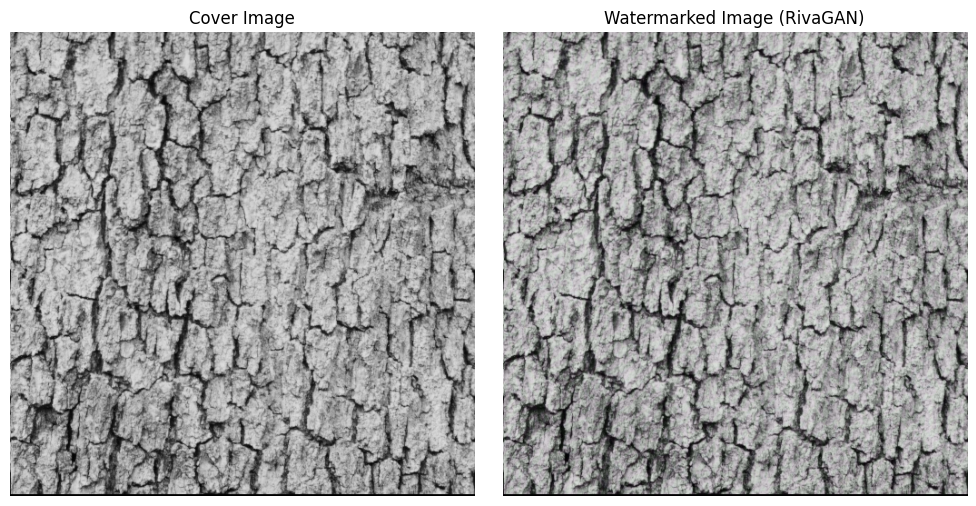

In [5]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(cover, cv2.COLOR_BGR2RGB))
plt.title("Cover Image")
plt.axis("off")


plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img_w, cv2.COLOR_BGR2RGB))
plt.title("Watermarked Image (RivaGAN)")
plt.axis("off")

plt.tight_layout()
plt.show()

In [6]:
psnr, ssim = compute_psnr_ssim(cover, img_w)
print(f"PSNR: {psnr:.2f} dB")
print(f"SSIM: {ssim:.4f}")

PSNR: 48.24 dB
SSIM: 0.9996


## Attacchi al watermark

In [7]:
def apply_watermarking_attacks(watermarked_img):
    attacks = {}
    img = watermarked_img.copy()
    h, w = img.shape[:2]

    # 1. JPEG Compression
    for q in [90, 70, 50, 30, 10]:
        encode_param = [int(cv2.IMWRITE_JPEG_QUALITY), q]
        _, encimg = cv2.imencode('.jpg', img, encode_param)
        attacks[f'JPEG_{q}'] = cv2.imdecode(encimg, cv2.IMREAD_GRAYSCALE)

    # 2. Gaussian Noise
    for sigma in [0.1, 0.2, 0.3, 0.4, 0.5]:
        noise = np.random.normal(0, sigma * 255, img.shape).astype(np.float32)
        noisy = img.astype(np.float32) + noise
        attacks[f'GaussianNoise_{sigma}'] = np.clip(noisy, 0, 255).astype(np.uint8)

    # 3. Cropping (con controllo di validità)
    for percent in [0.1, 0.2, 0.3, 0.4]:
        dh, dw = int(h * percent), int(w * percent)
        if h - 2 * dh <= 0 or w - 2 * dw <= 0:
            # crop NON valido → lo saltiamo
            continue
        cropped = img[dh:h-dh, dw:w-dw]
        resized = cv2.resize(cropped, (w, h), interpolation=cv2.INTER_CUBIC)
        attacks[f'Crop_{int(percent*100)}%'] = resized
    # 4. Rotation
    for angle in [5, 10, 15, 20, 25]:
        M = cv2.getRotationMatrix2D((w // 2, h // 2), angle, 1)
        rotated = cv2.warpAffine(
            img, M, (w, h),
            flags=cv2.INTER_CUBIC,
            borderMode=cv2.BORDER_REFLECT
        )
        attacks[f'Rotation_{angle}deg'] = rotated
    return attacks


def visualize_attacks(attacks, cols=3):
    n = len(attacks)
    rows = int(np.ceil(n / cols))

    plt.figure(figsize=(5 * cols, 5 * rows))

    for i, (name, img) in enumerate(attacks.items(), 1):
        plt.subplot(rows, cols, i)
        plt.imshow(img, cmap='gray')
        plt.title(name)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

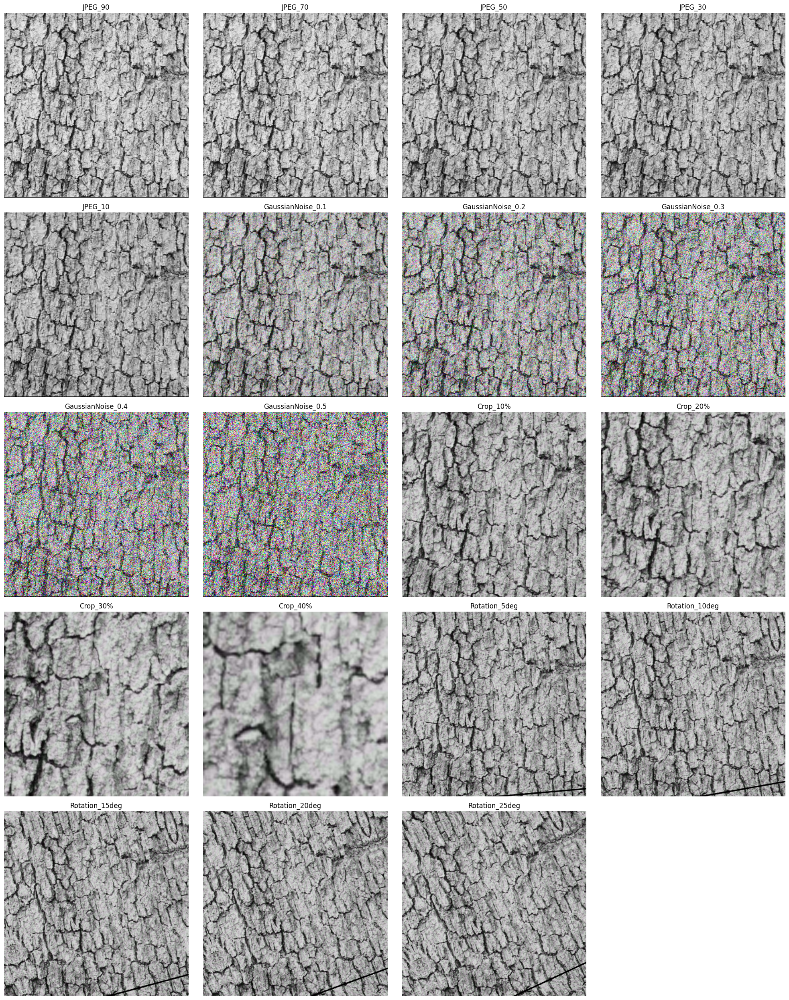

In [8]:
attacked_images = apply_watermarking_attacks(img_w)
visualize_attacks(attacked_images, cols=4)

## Valutazione BER e NC

In [ ]:
def calculate_rivaGAN_metrics(original_bits, extracted_bits):
    """
    Calcola le metriche di robustezza per il payload estratto.
    """
    # Assicuriamoci che siano array numpy
    orig = np.array(original_bits).astype(np.int32)
    extr = np.array(extracted_bits).astype(np.int32)

    # 1. Bit Error Rate (BER)
    ber = np.mean(orig!= extr)

    # 2. Normalized Correlation (NC) bipolare
    # Mappiamo i bit {0, 1} in {-1, 1}
    orig_bipolar = 2 * orig - 1
    extr_bipolar = 2 * extr - 1
    
    numerator = np.dot(orig_bipolar, extr_bipolar)
    denominator = np.linalg.norm(orig_bipolar) * np.linalg.norm(extr_bipolar)
    nc = numerator / (denominator + 1e-8)

    return ber, nc

In [ ]:
# Estrazione del watermark da ogni immagine attaccata
bit_img_jpeg_90 = extract_rivaGAN(attacked_images['JPEG_90'], num_bits=32)
bit_img_jpeg_70 = extract_rivaGAN(attacked_images['JPEG_70'], num_bits=32)
bit_img_jpeg_50 = extract_rivaGAN(attacked_images['JPEG_50'], num_bits=32)
bit_img_jpeg_30 = extract_rivaGAN(attacked_images['JPEG_30'], num_bits=32)
bit_img_jpeg_10 = extract_rivaGAN(attacked_images['JPEG_10'], num_bits=32)

bit_img_gaussian_0_1 = extract_rivaGAN(attacked_images['GaussianNoise_0.1'], num_bits=32)
bit_img_gaussian_0_2 = extract_rivaGAN(attacked_images['GaussianNoise_0.2'], num_bits=32)
bit_img_gaussian_0_3 = extract_rivaGAN(attacked_images['GaussianNoise_0.3'], num_bits=32)
bit_img_gaussian_0_4 = extract_rivaGAN(attacked_images['GaussianNoise_0.4'], num_bits=32)
bit_img_gaussian_0_5 = extract_rivaGAN(attacked_images['GaussianNoise_0.5'], num_bits=32)

bit_img_crop_10 = extract_rivaGAN(attacked_images['Crop_10%'], num_bits=32)
bit_img_crop_20 = extract_rivaGAN(attacked_images['Crop_20%'], num_bits=32)
bit_img_crop_30 = extract_rivaGAN(attacked_images['Crop_30%'], num_bits=32)
bit_img_crop_40 = extract_rivaGAN(attacked_images['Crop_40%'], num_bits=32)

bit_img_rot_5 = extract_rivaGAN(attacked_images['Rotation_5deg'], num_bits=32)
bit_img_rot_10 = extract_rivaGAN(attacked_images['Rotation_10deg'], num_bits=32)
bit_img_rot_15 = extract_rivaGAN(attacked_images['Rotation_15deg'], num_bits=32)
bit_img_rot_20 = extract_rivaGAN(attacked_images['Rotation_20deg'], num_bits=32)
bit_img_rot_25 = extract_rivaGAN(attacked_images['Rotation_25deg'], num_bits=32)

# Calcolo BER e NC per ogni attacco
ber_jpeg_90, nc_jpeg_90 = calculate_rivaGAN_metrics(msg_orig, bit_img_jpeg_90)
ber_jpeg_70, nc_jpeg_70 = calculate_rivaGAN_metrics(msg_orig, bit_img_jpeg_70)
ber_jpeg_50, nc_jpeg_50 = calculate_rivaGAN_metrics(msg_orig, bit_img_jpeg_50)
ber_jpeg_30, nc_jpeg_30 = calculate_rivaGAN_metrics(msg_orig, bit_img_jpeg_30)
ber_jpeg_10, nc_jpeg_10 = calculate_rivaGAN_metrics(msg_orig, bit_img_jpeg_10)
ber_gaussian_0_1, nc_gaussian_0_1 = calculate_rivaGAN_metrics(msg_orig, bit_img_gaussian_0_1)
ber_gaussian_0_2, nc_gaussian_0_2 = calculate_rivaGAN_metrics(msg_orig, bit_img_gaussian_0_2)
ber_gaussian_0_3, nc_gaussian_0_3 = calculate_rivaGAN_metrics(msg_orig, bit_img_gaussian_0_3)
ber_gaussian_0_4, nc_gaussian_0_4 = calculate_rivaGAN_metrics(msg_orig, bit_img_gaussian_0_4)
ber_gaussian_0_5, nc_gaussian_0_5 = calculate_rivaGAN_metrics(msg_orig, bit_img_gaussian_0_5)
ber_crop_10, nc_crop_10 = calculate_rivaGAN_metrics(msg_orig, bit_img_crop_10)
ber_crop_20, nc_crop_20 = calculate_rivaGAN_metrics(msg_orig, bit_img_crop_20)
ber_crop_30, nc_crop_30 = calculate_rivaGAN_metrics(msg_orig, bit_img_crop_30)
ber_crop_40, nc_crop_40 = calculate_rivaGAN_metrics(msg_orig, bit_img_crop_40)
ber_rot_5, nc_rot_5 = calculate_rivaGAN_metrics(msg_orig, bit_img_rot_5)
ber_rot_10, nc_rot_10 = calculate_rivaGAN_metrics(msg_orig, bit_img_rot_10)
ber_rot_15, nc_rot_15 = calculate_rivaGAN_metrics(msg_orig, bit_img_rot_15)
ber_rot_20, nc_rot_20 = calculate_rivaGAN_metrics(msg_orig, bit_img_rot_20)
ber_rot_25, nc_rot_25 = calculate_rivaGAN_metrics(msg_orig, bit_img_rot_25)

# Stampa dei risultati
print("-------------------------------------------------------------------------------")
print(f"JPEG 90%: BER={ber_jpeg_90:.4f}, NC={nc_jpeg_90:.4f}")
print(f"JPEG 70%: BER={ber_jpeg_70:.4f}, NC={nc_jpeg_70:.4f}")
print(f"JPEG 50%: BER={ber_jpeg_50:.4f}, NC={nc_jpeg_50:.4f}")
print(f"JPEG 30%: BER={ber_jpeg_30:.4f}, NC={nc_jpeg_30:.4f}")
print(f"JPEG 10%: BER={ber_jpeg_10:.4f}, NC={nc_jpeg_10:.4f}")
print("-------------------------------------------------------------------------------")
print(f"Gaussian Noise 0.1: BER={ber_gaussian_0_1:.4f}, NC={nc_gaussian_0_1:.4f}")
print(f"Gaussian Noise 0.2: BER={ber_gaussian_0_2:.4f}, NC={nc_gaussian_0_2:.4f}")
print(f"Gaussian Noise 0.3: BER={ber_gaussian_0_3:.4f}, NC={nc_gaussian_0_3:.4f}")
print(f"Gaussian Noise 0.4: BER={ber_gaussian_0_4:.4f}, NC={nc_gaussian_0_4:.4f}")
print(f"Gaussian Noise 0.5: BER={ber_gaussian_0_5:.4f}, NC={nc_gaussian_0_5:.4f}")
print("-------------------------------------------------------------------------------")
print(f"Crop 10%: BER={ber_crop_10:.4f}, NC={nc_crop_10:.4f}")
print(f"Crop 20%: BER={ber_crop_20:.4f}, NC={nc_crop_20:.4f}")
print(f"Crop 30%: BER={ber_crop_30:.4f}, NC={nc_crop_30:.4f}")
print(f"Crop 40%: BER={ber_crop_40:.4f}, NC={nc_crop_40:.4f}")
print("-------------------------------------------------------------------------------")
print(f"Rotation 5 deg: BER={ber_rot_5:.4f}, NC={nc_rot_5:.4f}")
print(f"Rotation 10 deg: BER={ber_rot_10:.4f}, NC={nc_rot_10:.4f}")
print(f"Rotation 15 deg: BER={ber_rot_15:.4f}, NC={nc_rot_15:.4f}")
print(f"Rotation 20 deg: BER={ber_rot_20:.4f}, NC={nc_rot_20:.4f}")
print(f"Rotation 25 deg: BER={ber_rot_25:.4f}, NC={nc_rot_25:.4f}")
print("-------------------------------------------------------------------------------")

-------------------------------------------------------------------------------
JPEG 90%: BER=0.4688, NC=0.0625
JPEG 70%: BER=0.4688, NC=0.0625
JPEG 50%: BER=0.4688, NC=0.0625
JPEG 30%: BER=0.4375, NC=0.1250
JPEG 10%: BER=0.4688, NC=0.0625
-------------------------------------------------------------------------------
Gaussian Noise 0.1: BER=0.0000, NC=1.0000
Gaussian Noise 0.2: BER=0.0312, NC=0.9375
Gaussian Noise 0.3: BER=0.0312, NC=0.9375
Gaussian Noise 0.4: BER=0.2188, NC=0.5625
Gaussian Noise 0.5: BER=0.2812, NC=0.4375
-------------------------------------------------------------------------------
Crop 10%: BER=0.0312, NC=0.9375
Crop 20%: BER=0.3125, NC=0.3750
Crop 30%: BER=0.4062, NC=0.1875
Crop 40%: BER=0.5000, NC=0.0000
-------------------------------------------------------------------------------
Rotation 5 deg: BER=0.0312, NC=0.9375
Rotation 10 deg: BER=0.0625, NC=0.8750
Rotation 15 deg: BER=0.0938, NC=0.8125
Rotation 20 deg: BER=0.2188, NC=0.5625
Rotation 25 deg: BER=0.3438

## Esperimenti sul dataset

In [ ]:
import os
import csv
import glob

def run_automated_benchmark_rivaGAN(input_folder, output_csv, num_bits=32):
    """
    Esegue il benchmark automatizzato utilizzando esclusivamente il modello RivaGAN.
    """
    # 1. Generazione del messaggio binario (32 bit per RivaGAN) 
    # Usiamo lo stesso seed per garantire che il messaggio sia identico a quello del DWT
    np.random.seed(42)
    message = np.random.randint(0, 2, num_bits)
    
    # Prepara il file CSV
    headers = ['nome immagine', 'psnr', 'ssim', 'nome attacco', 'ber', 'nc']
    
    with open(output_csv, mode='w', newline='') as file:
        writer = csv.DictWriter(file, fieldnames=headers)
        writer.writeheader()
        
        # 2. Ricerca immagini.tiff
        image_paths = glob.glob(os.path.join(input_folder, "*.tiff"))
        
        if not image_paths:
            print(f"Nessuna immagine.tiff trovata in {input_folder}")
            return

        for img_path in image_paths:
            img_name = os.path.basename(img_path)
            print(f"Processando RivaGAN su: {img_name}...")
            
            # Carica l'immagine originale
            cover = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
            if cover is None:
                continue
            
            # Ridimensionamento standard (512x512)
            cover = cv2.resize(cover, (512, 512))
            
            # 3. Embedding del watermark tramite RivaGAN
            watermarked_bgr = embed_rivaGAN(cover, message)
            
            # 4. Calcolo metriche di impercettibilita'
            watermarked_gray = cv2.cvtColor(watermarked_bgr, cv2.COLOR_BGR2GRAY)
            psnr_val, ssim_val = compute_psnr_ssim(cover, watermarked_gray)
            
            # 5. Simulazione degli attacchi
            attacks = apply_watermarking_attacks(watermarked_bgr)
            
            # 6. Estrazione e calcolo del benchmark per ogni attacco
            for attack_name, attacked_img in attacks.items():
                # Estrazione watermark
                extracted_message = extract_rivaGAN(attacked_img, num_bits=num_bits)
                
                # Calcolo BER e NC 
                ber, nc = calculate_rivaGAN_metrics(message, extracted_message)
                
                # Salvataggio riga nel CSV
                writer.writerow({
                    'nome immagine': img_name,
                    'psnr': f"{psnr_val:.4f}",
                    'ssim': f"{ssim_val:.4f}",
                    'nome attacco': attack_name,
                    'ber': f"{ber:.4f}",
                    'nc': f"{nc:.4f}"
                })

    print(f"Benchmark RivaGAN completato. Risultati salvati in: {output_csv}")

In [12]:
run_automated_benchmark_rivaGAN('data', 'benchmark_rivaGAN.csv')

Processando RivaGAN su: 1.1.01.tiff...
Processando RivaGAN su: 1.1.02.tiff...
Processando RivaGAN su: 1.1.03.tiff...
Processando RivaGAN su: 1.1.04.tiff...
Processando RivaGAN su: 1.1.05.tiff...
Processando RivaGAN su: 1.1.06.tiff...
Processando RivaGAN su: 1.1.07.tiff...
Processando RivaGAN su: 1.1.08.tiff...
Processando RivaGAN su: 1.1.09.tiff...
Processando RivaGAN su: 1.1.10.tiff...
Processando RivaGAN su: 1.1.11.tiff...
Processando RivaGAN su: 1.1.12.tiff...
Processando RivaGAN su: 1.1.13.tiff...
Processando RivaGAN su: 1.2.01.tiff...
Processando RivaGAN su: 1.2.02.tiff...
Processando RivaGAN su: 1.2.03.tiff...
Processando RivaGAN su: 1.2.04.tiff...
Processando RivaGAN su: 1.2.05.tiff...
Processando RivaGAN su: 1.2.06.tiff...
Processando RivaGAN su: 1.2.07.tiff...
Processando RivaGAN su: 1.2.08.tiff...
Processando RivaGAN su: 1.2.09.tiff...
Processando RivaGAN su: 1.2.10.tiff...
Processando RivaGAN su: 1.2.11.tiff...
Processando RivaGAN su: 1.2.12.tiff...
Processando RivaGAN su: 1

In [ ]:
import pandas as pd

def evaluate_dataset_imperceptibility(csv_path):
    # 1. Caricamento del file CSV
    df = pd.read_csv(csv_path)
    
    # Assicuriamoci che i valori siano numerici
    df['psnr'] = pd.to_numeric(df['psnr'], errors='coerce')
    df['ssim'] = pd.to_numeric(df['ssim'], errors='coerce')
    
    # 2. Selezione di un solo record per immagine
    # Dato che PSNR e SSIM sono calcolati prima degli attacchi, 
    # prendiamo solo la prima occorrenza per ogni 'nome immagine'
    unique_images_df = df.drop_duplicates(subset=['nome immagine'])
    
    # 3. Calcolo delle medie del dataset
    avg_psnr = unique_images_df['psnr'].mean()
    avg_ssim = unique_images_df['ssim'].mean()
    num_images = len(unique_images_df)
    
    print("-" * 40)
    print(f"RISULTATI MEDI DATASET ({num_images} immagini)")
    print("-" * 40)
    print(f"PSNR Medio: {avg_psnr:.2f} dB")
    print(f"SSIM Medio: {avg_ssim:.4f}")
    print("-" * 40)

evaluate_dataset_imperceptibility('benchmark_rivaGAN.csv')

----------------------------------------
RISULTATI MEDI DATASET (210 immagini)
----------------------------------------
PSNR Medio: 49.00 dB
SSIM Medio: 0.9978
----------------------------------------


## Valutazione NC e BER

In [ ]:
def evaluate_attacks_robustness(csv_path):
    # 1. Caricamento dati
    df = pd.read_csv(csv_path)
    
    # Assicuriamoci che i valori siano numerici
    df['ber'] = pd.to_numeric(df['ber'], errors='coerce')
    df['nc'] = pd.to_numeric(df['nc'], errors='coerce')
    
    # 2. Raggruppamento per tipo di attacco
    # Calcoliamo la media di BER e NC per ogni gruppo di attacchi
    attack_summary = df.groupby('nome attacco').agg({
        'ber': 'mean',
        'nc': 'mean'
    }).reset_index()
    
    # 3. Ordinamento per BER crescente
    attack_summary = attack_summary.sort_values(by='ber')
    
    # 4. Formattazione e stampa dei risultati
    print("-" * 90)
    print(f"{'NOME ATTACCO':<25} | {'BER MEDIO':<12} | {'NC MEDIA':<10}")
    print("-" * 90)
    
    for _, row in attack_summary.iterrows():
        print(f"{row['nome attacco']:<25} | {row['ber']:<12.4f} | {row['nc']:<10.4f}")
    print("-" * 90)
    
    return attack_summary

report_attacchi = evaluate_attacks_robustness('benchmark_rivaGAN.csv')

------------------------------------------------------------------------------------------
NOME ATTACCO              | BER MEDIO    | NC MEDIA  
------------------------------------------------------------------------------------------
Rotation_5deg             | 0.0241       | 0.9518    
Rotation_10deg            | 0.0345       | 0.9310    
Crop_10%                  | 0.0366       | 0.9268    
GaussianNoise_0.1         | 0.0464       | 0.9071    
Rotation_15deg            | 0.0640       | 0.8720    
Rotation_20deg            | 0.1515       | 0.6970    
GaussianNoise_0.2         | 0.1589       | 0.6821    
Crop_20%                  | 0.1885       | 0.6229    
Rotation_25deg            | 0.2616       | 0.4768    
GaussianNoise_0.3         | 0.2740       | 0.4521    
GaussianNoise_0.4         | 0.3369       | 0.3262    
GaussianNoise_0.5         | 0.3754       | 0.2491    
Crop_30%                  | 0.4219       | 0.1562    
Crop_40%                  | 0.4670       | 0.0661    
JPEG_10 